# Google Trends data

In [1]:
%pylab inline
from pytrends.request import TrendReq
from datetime import date
import requests
import json
from io import StringIO
import plotly.express as px
import ipywidgets as widgets
from datetime import datetime, date
import pandas as pd
import imageio
import sys, os
import imageio
import plotly.graph_objects as go



Populating the interactive namespace from numpy and matplotlib


In [2]:
# hllist = ["it", "ja", "en", "fr", "de"] 
# cat for Infectious Diseases: 632
# cat for Cold & Flu: 629

pytrend = TrendReq(hl='it-IT', tz=0, timeout=(10,25), retries=2, backoff_factor=0.1)

In [3]:
kw_list = ["Covid", "coronavirus"]
pytrend.build_payload(kw_list, cat=0, timeframe='today 3-m', geo='', gprop='')

In [68]:
kw_list

['Covid', 'coronavirus']

In [69]:
# hi = pytrend.get_historical_interest(kw_list, year_start=2020, month_start=1, day_start=1, hour_start=0, year_end=2020, month_end=4, day_end=1, hour_end=0, cat=0, geo='', gprop='', sleep=10)
# hi
# hi_day = hi.resample('d', label='right').sum()
# hi_day.plot()

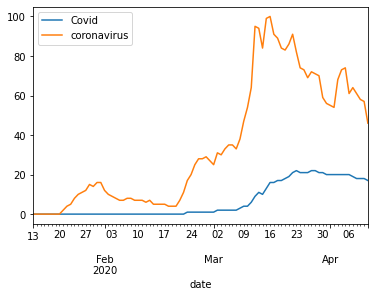

In [70]:
iot = pytrend.interest_over_time()
iot.plot()

In [71]:

fig = go.Figure(
    data=[go.Scatter(x=iot.index, y=iot["coronavirus"])],
    layout=dict(title=dict(text="testing"))
)
fig.show()

# Get data per region (inspired from Pietro's code)

In [6]:
codes = {"IT-65":"Abruzzo",
"IT-77":"Basilicata",
"IT-78":"Calabria",
"IT-72":"Campania",
"IT-45":"Emilia-Romagna",
"IT-62":"Lazio",
"IT-42":"Liguria",
"IT-25":"Lombardia",
"IT-57":"Marche",
"IT-67":"Molise",
"IT-21":"Piemonte",
"IT-75":"Puglia",
"IT-52":"Toscana",
"IT-55":"Umbria",
"IT-34":"Veneto",
"IT-36":"Friuli-Venezia Giulia",
"IT-88":"Sardegna",
"IT-82":"Sicilia",
"IT-32":"Trentino-Alto Adige/Südtirol",
"IT-23":"Valle d'Aosta/Vallée d'Aoste",
   "IT":"Italia"}
pytrend = TrendReq( tz=0, timeout=(10,25), retries=2, backoff_factor=0.1)
kw_list =['coronavirus']
today = date.today()
res = {}
for c in codes:
    print(codes[c],"...", end = '')
    try:
        pytrend.build_payload(kw_list,geo=c,timeframe='2019-12-01 '+str(today))
        res[c] = pytrend.interest_over_time()
        print("done!")
    except HTTPSConnectionPool as e: 
        print(e)
    except:
        print("Unexpected error:", sys.exc_info()[0])


Abruzzo ...done!
Basilicata ...done!
Calabria ...done!
Campania ...done!
Emilia-Romagna ...done!
Lazio ...done!
Liguria ...done!
Lombardia ...done!
Marche ...done!
Molise ...done!
Piemonte ...done!
Puglia ...done!
Toscana ...done!
Umbria ...done!
Veneto ...done!
Friuli-Venezia Giulia ...done!
Sardegna ...done!
Sicilia ...done!
Trentino-Alto Adige/Südtirol ...done!
Valle d'Aosta/Vallée d'Aoste ...done!
Italia ...done!


# Preprocess data

In [7]:
res_day['IT'].head()

NameError: name 'res_day' is not defined

In [8]:

test_date = datetime(2020, 3, 30)
res_day = {key: value.resample('d', label='right').sum() for key, value in res.items() }
df = pd.concat(res_day.values(), keys=res_day.keys())
#df.loc[(: test_date)]
df.index.names = ["region", "date"]
df = df.reset_index()
df["reg_name"] = [codes[r["region"]] for i,r in df.iterrows()]

df.loc[df["date"] == test_date]
# slice('A1', 'A3','ddd','ddd')
#df = {"coronavirus": }

df.head()
df_log = df.replace(0, 1)
df["coronavirus_log"] = np.log10(df_log["coronavirus"])
df

,region,date,coronavirus,isPartial,reg_name,coronavirus_log
0,IT-65,2019-12-02,0,False,Abruzzo,0.000000
1,IT-65,2019-12-03,0,False,Abruzzo,0.000000
2,IT-65,2019-12-04,0,False,Abruzzo,0.000000
3,IT-65,2019-12-05,0,False,Abruzzo,0.000000
4,IT-65,2019-12-06,0,False,Abruzzo,0.000000
...,...,...,...,...,...,...
2788,IT,2020-04-08,30,False,Italia,1.477121
2789,IT,2020-04-09,29,False,Italia,1.462398
2790,IT,2020-04-10,29,False,Italia,1.462398
2791,IT,2020-04-11,28,False,Italia,1.447158


In [9]:
out.drop(['B']

SyntaxError: unexpected EOF while parsing (<ipython-input-9-c13f3466ca0b>, line 1)

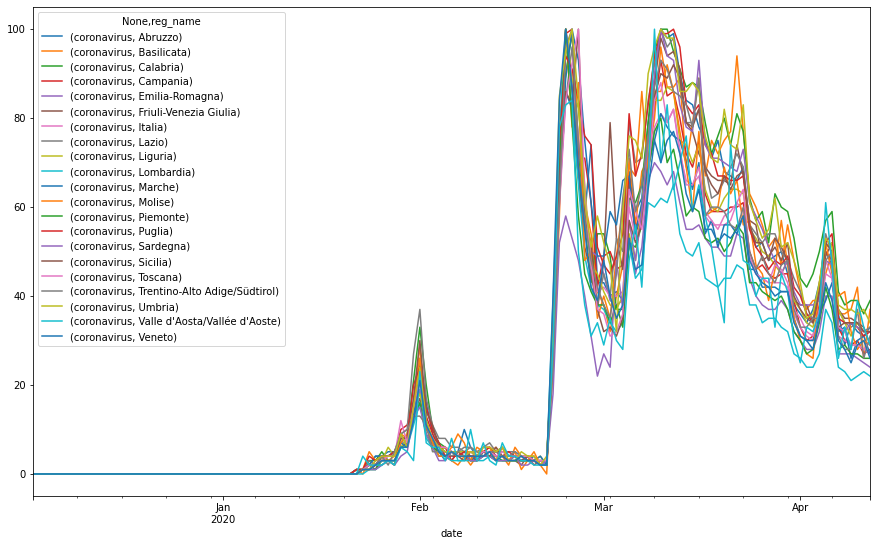

In [10]:
piv = pd.pivot_table(df, index=['date'],columns=['reg_name'], values=['coronavirus'])
piv.plot(figsize=(15,9))

# Get Geojson file

In [4]:
URL_regions_geojson="https://github.com/openpolis/geojson-italy/raw/master/geojson/limits_IT_regions.geojson"

def get_geojson_url(url):
    try: 
        s=requests.get(url)
        return json.load(StringIO(s.text))
    except exception as e:
        # Need to check its an 404, 503, 500, 403 etc.
        print("http error %s" % e.response.status_code)

geojson_region = get_geojson_url(URL_regions_geojson)

region_properties = [g['properties'] for g in geojson_region['features']]
# {'reg_name': 'Piemonte', 'reg_istat_code_num': 1, 'reg_istat_code': '01'}
# region_properties


# Plot map

In [22]:
def region_map(file, title, color_field = "coronavirus", max_value=None):
    if not max_value:
        max_value = file[color_field].max()
    fig = px.choropleth(file, geojson=geojson_region, 
                        color=color_field,
                        range_color=(0, max_value),
                        locations="reg_name", 
                        featureidkey="properties.reg_name",
                        #projection="mercator",
                        hover_data=["reg_name", "region" , color_field],
                        labels={color_field:color_field}
                       )
    fig.update_geos(fitbounds="locations", visible=False)
    
    fig.update_layout(
        margin={"r":0,"t":30,"l":0,"b":0},
        title={
        'text': title,
        'y':0.98,
        'x':0.1},
        title_font_size=20,
        
        #geo_scope='europe', # limite map scope to Europe
        annotations = [dict(
            x=0.55,
            y=0.05,
            xref='paper',
            yref='paper',
            text='Source: Google Trends <br> ©SonyCSL',
            showarrow = False
    ), 
      dict(
            x=0.75,
            y=0.75,
            xref='paper',
            yref='paper',
            text='National Lockdown',
            showarrow = False
    )                
    ]
    )
    return fig

test_date = datetime(2020, 4, 1)
file = df.loc[df["date"] == test_date]
title = "Total searches for %s "% test_date.strftime("%d %b %Y")
fig = region_map(file, title, color_field = "coronavirus", max_value=100)
fig.show()


In [18]:
images_dir = "images"
start_date = datetime(2020, 4, 1)
end_date = datetime(2020, 4, 8)
available_dates = pd.date_range(start=start_date, end=end_date, freq='D')
options = [(date.strftime(' %d/%m/%Y '), date) for date in available_dates]

selection_slider = widgets.SelectionSlider(
    options = options,
    index = len(options)-1 ,
    description='Date',
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    layout={'width': '600px'}
)



In [20]:

def update_map(date):
    file = df.loc[df["date"] == date]
    title = "Total searches of %s for %s "% ("coronavirus", date.strftime("%d %b %Y"))
    print(title)
    fig = region_map(file, title, color_field = "coronavirus")
    fig.show()
    

widgets.interact(
    update_map,
    date=selection_slider
);

fig.write_html("test.html")



interactive(children=(SelectionSlider(continuous_update=False, description='Date', index=7, layout=Layout(widt…

## Interest per region

In [29]:
# interest per region
pytrend = TrendReq( tz=0, timeout=(10,25), retries=2, backoff_factor=0.1)
kw_list = ["coronavirus"]
pytrend.build_payload(kw_list, cat=0, timeframe='today 3-m', geo='IT', gprop='')
ibr_total = pytrend.interest_by_region(inc_geo_code=False)
#pytrends.interest_by_region(resolution='REGION', inc_low_vol=True, inc_geo_code=False)

ibr_total=ibr_total.reset_index()
geoName=ibr_total['geoName']

fig = go.Figure(data=[
    go.Bar(name='coronavirus', x=geoName, y=ibr_total['coronavirus']),
    #go.Bar(name='covid', x=geoName, y=ibr_total["covid"])
])
# Change the bar mode
fig.update_layout(barmode='stack')
fig.show()

# Make Gif

In [47]:

def plot_for_day(df, date, images_dir, field):
    file = df.loc[df["date"] == date]
    title = "Total searches of %s for %s "% (field, date.strftime("%d %b %Y"))
    print(title)
    fig = region_map(file, title, color_field = field)
    #img_bytes = fig.to_image(format="png", width=600, height=350, scale=2)
    #     fig.canvas.draw()       # draw the canvas, cache the renderer
    #     image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    fig.write_image(images_dir + "/fig_%s.png" % date.strftime("%Y%m%d"))
    return fig
# plot_for_day(datetime(2020, 3, 23))

def make_gif(images_dir="images"):
    kwargs_write = {'fps':1.0, 'quantizer':'nq'}
    images=[]
    for file_name in sorted(os.listdir(images_dir)):
        if file_name.endswith('.png') :
            print(file_name)
            file_path = os.path.join(images_dir, file_name)
            images.append(imageio.imread(file_path))
    imageio.mimsave(images_dir+'/fig_evolution.gif', images, duration=0.7)
    


In [15]:
images_dir = "images"
start_date = datetime(2020, 4, 7)
end_date = datetime(2020, 4, 8)
daterange = pd.date_range(start_date, end_date)
figs = [ plot_for_day(df, date, images_dir, "coronavirus") for date in daterange]

NameError: name 'plot_for_day' is not defined

In [23]:
make_gif(images_dir=images_dir)

fig_20200201.png
fig_20200202.png
fig_20200203.png
fig_20200204.png
fig_20200205.png
fig_20200206.png
fig_20200207.png
fig_20200208.png
fig_20200209.png
fig_20200210.png
fig_20200211.png
fig_20200212.png
fig_20200213.png
fig_20200214.png
fig_20200215.png
fig_20200216.png
fig_20200217.png
fig_20200218.png
fig_20200219.png
fig_20200220.png
fig_20200221.png
fig_20200222.png
fig_20200223.png
fig_20200224.png
fig_20200225.png
fig_20200226.png
fig_20200227.png
fig_20200228.png
fig_20200229.png
fig_20200301.png
fig_20200302.png
fig_20200303.png
fig_20200304.png
fig_20200305.png
fig_20200306.png
fig_20200307.png
fig_20200308.png
fig_20200309.png
fig_20200310.png
fig_20200311.png
fig_20200312.png
fig_20200313.png
fig_20200314.png
fig_20200315.png
fig_20200316.png
fig_20200317.png
fig_20200318.png
fig_20200319.png
fig_20200320.png
fig_20200321.png
fig_20200322.png
fig_20200323.png
fig_20200324.png
fig_20200325.png
fig_20200326.png
fig_20200327.png
fig_20200328.png
fig_20200329.png
fig_20200330.p

In [20]:
df["coronavirus_log"].max()

2.0

# Import Pietro's data

In [43]:
# use data from pietro
import pickle
folder = "trends_downloader_and_data/"
with open(folder + "it_raw_data_ibr_w_old.p", 'rb') as f:
    it_ibr = pickle.load(f)
with open(folder + "raw_data_ibr_w_old.p", 'rb') as f:
    ibr = pickle.load(f)


def transform_to_df(j_dict):
    df = pd.concat(j_dict.values(), keys=j_dict.keys())
    df.index.names = ["region", "date"]
    df=df.reset_index()
    df['reg_name']=[codes[r["region"]] for i,r in df.iterrows()]
    df_log = df.replace(0, 1)
    df["coronavirus_log"] = np.log10(df_log["coronavirus"])
    return df

     region       date  coronavirus                      reg_name  \
1975  IT-23 2020-04-04     3.151104  Valle d'Aosta/Vallée d'Aoste   
1976  IT-23 2020-04-05     2.444822  Valle d'Aosta/Vallée d'Aoste   
1977  IT-23 2020-04-06     1.412564  Valle d'Aosta/Vallée d'Aoste   
1978  IT-23 2020-04-07     2.716469  Valle d'Aosta/Vallée d'Aoste   
1979  IT-23 2020-04-08     1.901528  Valle d'Aosta/Vallée d'Aoste   

      coronavirus_log  
1975         0.498463  
1976         0.388247  
1977         0.150008  
1978         0.434005  
1979         0.279103  


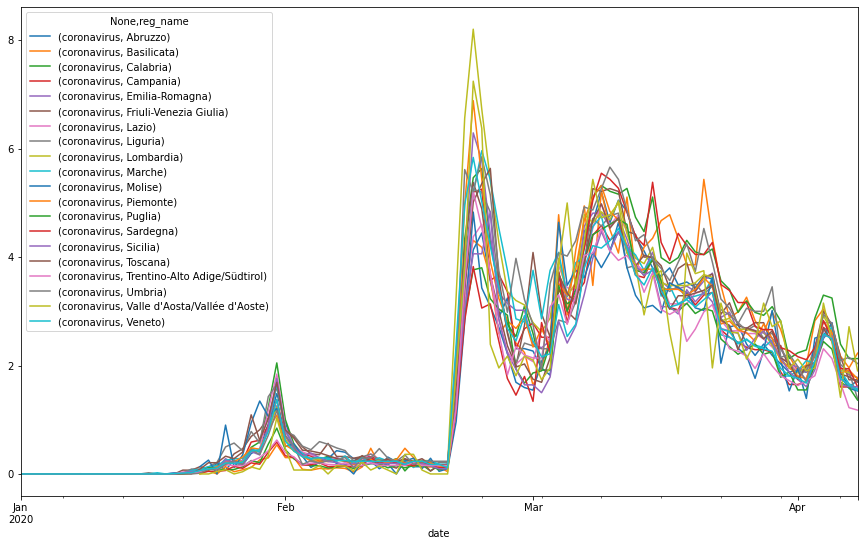

In [51]:
 
df = transform_to_df(ibr)
print(df.tail())
piv = pd.pivot_table(df, index=['date'],columns=['reg_name'], values=['coronavirus'])
piv.plot(figsize=(15,9))


In [50]:
make_gif(images_dir="images")

RuntimeError: Zero images were written.

# Behavioural change in Italy
Change of behaviour among italians observed in Gtrends. 

1. Information gathering: Coronavirus, symptoms, stats
2. Worries about future: economic impact? Recession? How long will it last? 
3. How to deal with it: How to make masks? How to cut hair? do exercises at home? cook food? Spend time?


In [15]:
pytrend = TrendReq( tz=0, timeout=(10,25), retries=2, backoff_factor=0.1)

## Information gathering

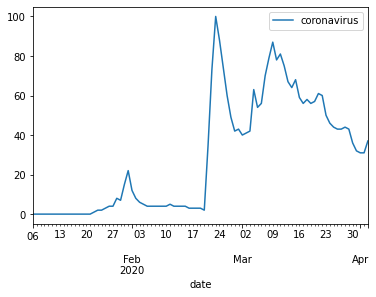

In [16]:

pytrend.build_payload(["coronavirus"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()
#pytrend.related_queries()

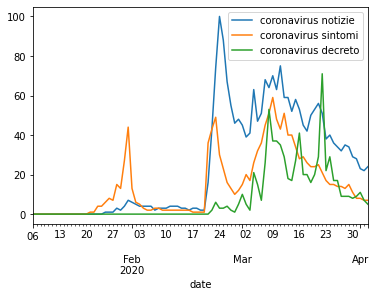

In [17]:
pytrend.build_payload(["coronavirus notizie", "coronavirus sintomi", "coronavirus decreto"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()
# pytrend.related_queries()

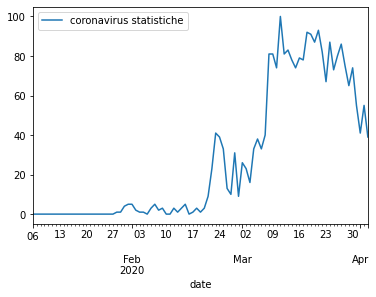

In [18]:
pytrend.build_payload(["coronavirus statistiche"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()


# Future worries

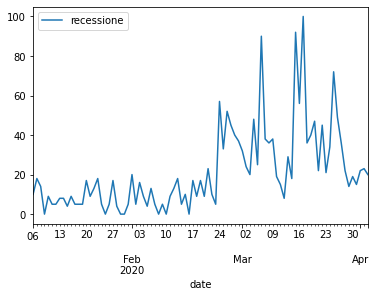

In [19]:
pytrend.build_payload(["recessione"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()

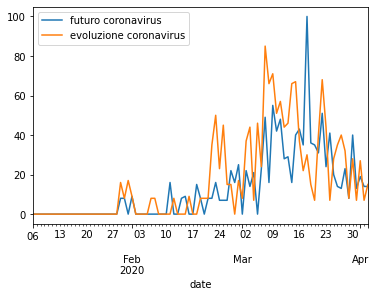

In [20]:
pytrend.build_payload(["futuro coronavirus", "evoluzione coronavirus"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()


In [21]:
related = pytrend.related_queries()
related

{'futuro coronavirus': {'top':                                 query  value
  0  profezie cosa ci riserva il futuro    100,
  'rising':                                 query   value
  0  profezie cosa ci riserva il futuro  557950},
 'evoluzione coronavirus': {'top':                             query  value
  0  grafico evoluzione coronavirus    100,
  'rising':                             query   value
  0  grafico evoluzione coronavirus  108800}}

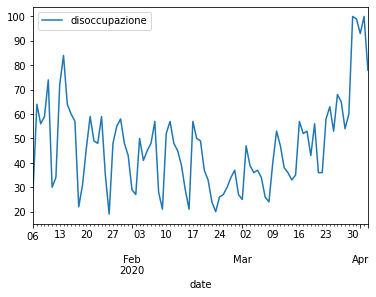

In [22]:
pytrend.build_payload(["disoccupazione"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()

## How to deal with situation


### How to do

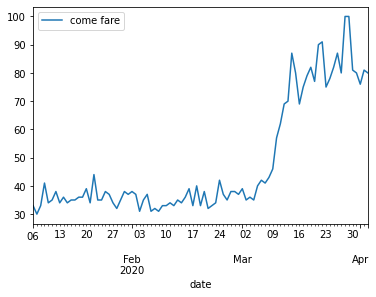

In [23]:
pytrend.build_payload(["come fare"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()

In [24]:
out2 = pytrend.related_queries()
out2['come fare']["rising"].head(15)

,query,value
0,come fare una mascherina,135350
1,come fare le mascherine,74750
2,come fare mascherine antivirus,74300
3,come fare amuchina,41500
4,come fare tampone coronavirus,36600
5,come fare mascherine di stoffa,29400
6,come fare mascherina chirurgica,29250
7,come fare il lievito di birra in casa,25050
8,come fare la spesa online,23700
9,come fare videochiamata di gruppo,22200


In [25]:
out2['come fare']["top"].head(15)

,query,value
0,come fare pizza,100
1,come fare il lievito,99
2,come fare il pane,95
3,come fare mascherine,78
4,come fare lievito madre,69
5,come fare una mascherina,62
6,come fare la pizza,58
7,come fare soldi,56
8,come fare pane in casa,56
9,come fare la pasta,55


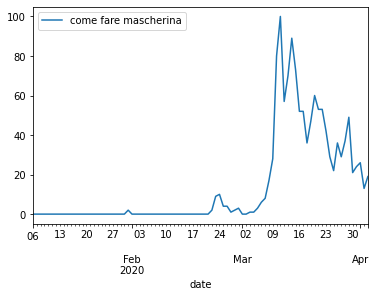

In [26]:
pytrend.build_payload(["come fare mascherina"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()


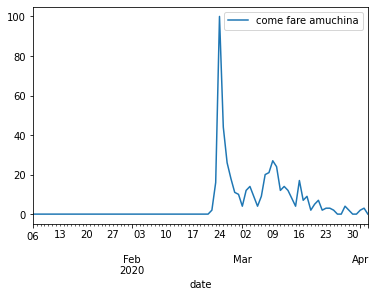

In [27]:
pytrend.build_payload(["come fare amuchina"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()

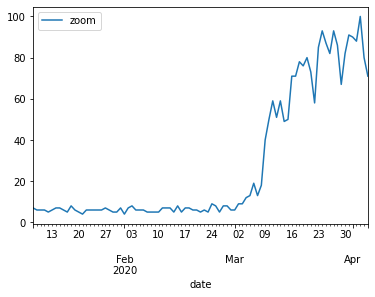

In [37]:
pytrend.build_payload(["zoom"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()

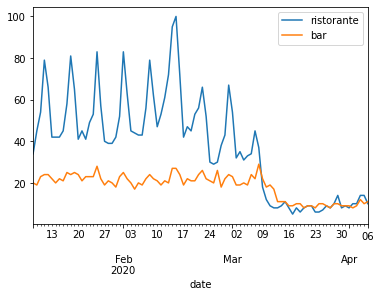

In [40]:
pytrend.build_payload(["ristorante", "bar"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()

### at home

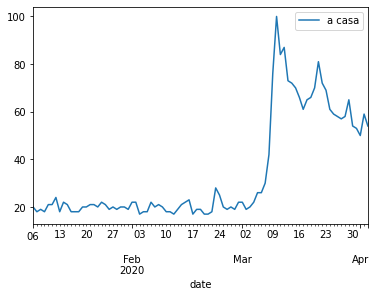

In [28]:
pytrend.build_payload(["a casa"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()


In [29]:
related = pytrend.related_queries()
related['a casa']["rising"].head(15)

,query,value
0,io resto a casa,413300
1,decreto resto a casa,97300
2,decreto io resto a casa,94250
3,restate a casa,48700
4,esselunga spesa a domicilio,41650
5,a che ora esce la casa di carta,40200
6,spesa online conad,37400
7,restiamo a casa,35450
8,spesa online coop,32450
9,lidl spesa a casa,31850


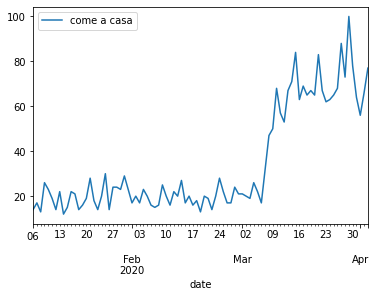

In [38]:
pytrend.build_payload(["come a casa"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()


In [39]:
related = pytrend.related_queries()
related['come a casa']["rising"].head(15)

,query,value
0,come fare il pane a casa,80450
1,come tagliare i capelli uomo a casa,50350
2,come fare il pane in casa,43050
3,come togliere il gel a casa,30850
4,come si cura il coronavirus a casa,24600
5,come fare lievito di birra a casa,18600
6,come fare amuchina a casa,18450
7,come fare i cornetti a casa,18300
8,come curare il coronavirus a casa,12350
9,come mantenersi in forma a casa,6200


In [42]:
pytrend.build_payload(["come a casa"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
topic = pytrend.related_topics()
topic['come a casa']['rising']

,value,formattedValue,link,topic_mid,topic_title,topic_type
0,115100,Breakout,/trends/explore?q=/m/03c5l5r&date=today+3-m&ge...,/m/03c5l5r,Esselunga,Retail-store company
1,79100,Breakout,/trends/explore?q=/m/09728&date=today+3-m&geo=IT,/m/09728,Bread,Food
2,64400,Breakout,/trends/explore?q=/m/022fy2&date=today+3-m&geo=IT,/m/022fy2,Cutting,Topic
3,63850,Breakout,/trends/explore?q=/m/088lm&date=today+3-m&geo=IT,/m/088lm,Yeast,Fungus
4,57250,Breakout,/trends/explore?q=/m/032f6&date=today+3-m&geo=IT,/m/032f6,Persian Language,Spoken language
5,49300,Breakout,/trends/explore?q=/m/02fbjn&date=today+3-m&geo=IT,/m/02fbjn,Disinfection,Topic
6,43100,Breakout,/trends/explore?q=/m/0300d&date=today+3-m&geo=IT,/m/0300d,Fare,Topic
7,42800,Breakout,/trends/explore?q=/m/069q9&date=today+3-m&geo=IT,/m/069q9,Quarantine,Topic
8,35850,Breakout,/trends/explore?q=/m/09702&date=today+3-m&geo=IT,/m/09702,Cappuccino,Coffee drink
9,35650,Breakout,/trends/explore?q=/m/040y3g&date=today+3-m&geo=IT,/m/040y3g,Landline,Topic


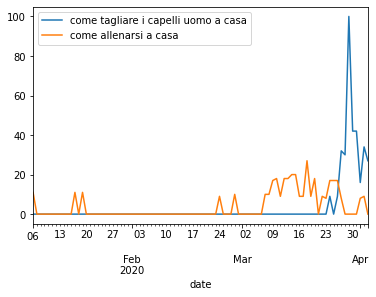

In [32]:
pytrend.build_payload(["come tagliare i capelli uomo a casa","come allenarsi a casa"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()


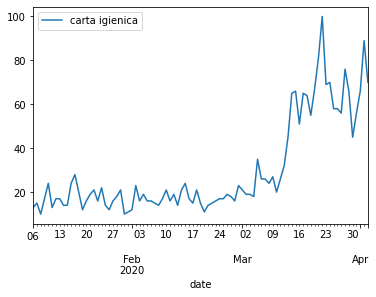

In [33]:
pytrend.build_payload(["carta igienica"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()

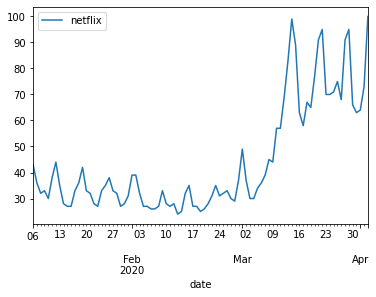

In [34]:
pytrend.build_payload(["netflix"], cat=0, timeframe='today 3-m', geo='IT', gprop='')
out = pytrend.interest_over_time()
out.plot()

# Import Pietr